This notebook reproduces the experimental results presented in our manuscript. Instructions for accessing the data are available in /data/README.md.

In [1]:
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt

import scanpy as sc

import sys 
sys.path.append("..") 
sys.path.append("../..") 

In [2]:

# benchmarking=['MOFA+', 'MEFISTO', 'MultiVI', 'PRESENT', 'scMM', 'SpatialGlue','SMART']
# methods=['MOFA+', 'MEFISTO', 'Seurat','MultiVI','TotalVI', 'PRESENT', 'scMM', 'SpatialGlue', 'SNF','SMART']
# colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',"#33a02c", '#9467bd', '#8c564b', '#7f7f7f', '#bcbd22', '#e377c2']
# color_dicts={i:j for i,j in zip(methods,colors)}
paths=['adata_mofa.h5ad', 'adata_mefisto.h5ad', 'adata_MultiVI.h5ad', 'adata_present.h5ad', 'adata_scMM.h5ad', 'adata_SpatialGlue.h5ad', 'adata_SMART.h5ad']

In [3]:
benchmarking=['MOFA+', 'MEFISTO', 'MultiVI', 'PRESENT', 'scMM', 'SpatialGlue', 'CellCharter','MISO','COSMOS','SMART']
paths=['adata_mofa.h5ad', 'adata_mefisto.h5ad', 'adata_MultiVI.h5ad', 'adata_present.h5ad', 'adata_scMM.h5ad', 'adata_SpatialGlue.h5ad',  
       'adata_cellcharter.h5ad','adata_miso.h5ad','adata_COSMOS.h5ad','adata_SMART.h5ad']

In [4]:
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
plt.rcdefaults()
plt.rcParams["axes.titlesize"] = 9
plt.rcParams["legend.fontsize"] = 8               
plt.rcParams["legend.title_fontsize"] = 9 
plt.rcParams['axes.titlepad'] = 3

In [ ]:
color_dicts = {
    'MOFA+': '#1f77b4',     # blue
    'MEFISTO': '#ff7f0e',   # orange
    'MultiVI': '#2ca02c',   # green
    'PRESENT': '#d62728',   # red
    'scMM': '#9467bd',      # purple
    'SpatialGlue': '#8c564b',  # brown
    'TotalVI': '#e377c2',   # pink
    'SpaMultiVAE': '#7f7f7f',  # gray
    'CellCharter': '#bcbd22',  # yellow-green
    'MISO': '#17becf',      # cyan
    'COSMOS': '#FFC0CB',    # light pink
    'SMART': '#ff69b4',     # hot pink
    'SNF': '#ff6347',       # tomato red
    'WNN': '#4682b4',       # steel blue
}

/tmp/ipykernel_3777168/1925245779.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels())


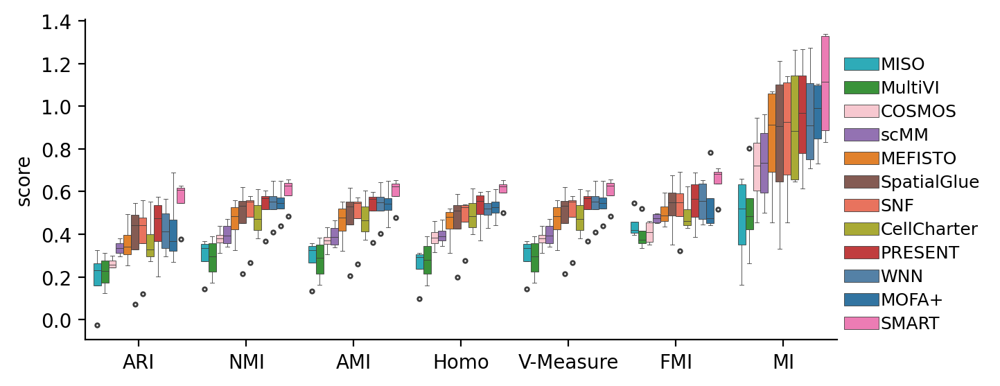

In [6]:
names=["E18.5_S1","E15.5_S1","E13.5_S1","E11.0_S1"]
adatas={}
results=pd.DataFrame()
paths=["./Mouse_Brain_E18_S1/","./Mouse_Brain_E15_S1/","./Mouse_Brain_E13_S1/","./Mouse_Brain_E11_S1/"]
for name,path in zip(names,paths):
    adata=sc.read_h5ad(path+"adata_all.h5ad")
    adatas[name]=adata
    result=pd.read_csv(path+"result.csv")
    result["batch"]=name
    results=pd.concat([results,result])
    
result_df=results[(results["batch"]=="E18.5_S1")&(results["n_cluster"]==10)|
        (results["batch"]=="E15.5_S1")&(results["n_cluster"]==10)|
        (results["batch"]=="E13.5_S1")&(results["n_cluster"]==7)|
        (results["batch"]=="E11.0_S1")&(results["n_cluster"]==5)]
result_df=result_df[result_df["metries"].isin(["ARI","NMI","AMI","Homo","MI","V-Measure","FMI"])]
methods=['SNF','WNN','MOFA+', 'MEFISTO', 'MultiVI', 'PRESENT', 'scMM', 'SpatialGlue', 'CellCharter','MISO','COSMOS','SMART']
od=result_df.groupby("method")["score"].mean().sort_values(ascending=True).index

import seaborn as sns
fig,ax = plt.subplots(figsize=(7,3),dpi=200)
sns.boxplot(x="metries",y="score",hue="method",data=result_df,ax=ax, fliersize=2,linewidth=0.3,width=0.85,palette=color_dicts,
            hue_order=od,order=["ARI","NMI","AMI","Homo","V-Measure","FMI","MI"])
ax.set_xlabel("")
ax.set_xticklabels(ax.get_xticklabels())
ax.legend(loc=(1,0),frameon=False,ncol=1,labelspacing=0.4,handletextpad=0.1,fontsize=9)
sns.despine()
fig.savefig("metries.svg",format="svg",bbox_inches='tight',transparent=True)

/tmp/ipykernel_3777168/3750296172.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y="method",x="score",data=result_,ax=ax[k], fliersize=2,linewidth=0.8,width=0.6,palette=color_dicts,order=od, showfliers=False)
/tmp/ipykernel_3777168/3750296172.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[k].legend().remove()
/tmp/ipykernel_3777168/3750296172.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[k].set_xticklabels(ax[k].get_xticklabels(),fontsize=7)
/tmp/ipykernel_3777168/3750296172.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

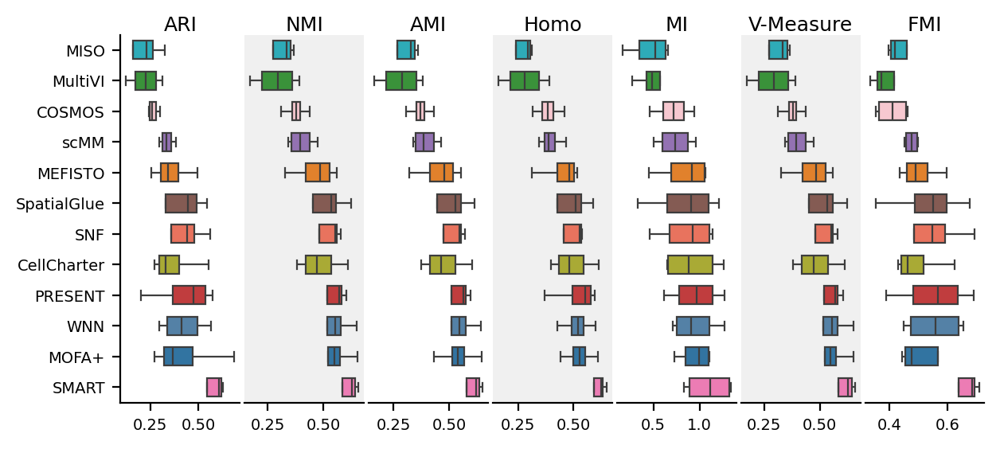

In [8]:
result=result_df
result=result[result["metries"].isin(["ARI","NMI","AMI","Homo","MI","V-Measure","FMI"])]
od=result.groupby("method")["score"].mean().sort_values(ascending=True).index
od=result.groupby("method")["score"].mean().sort_values(ascending=True).index
import seaborn as sns
fig,ax = plt.subplots(1,7,figsize=(7,3),dpi=200)
plt.subplots_adjust(wspace=0.04)

for k,i in enumerate(["ARI","NMI","AMI","Homo","MI","V-Measure","FMI"]):
    result_=result[result["metries"]==i]
    sns.boxplot(y="method",x="score",data=result_,ax=ax[k], fliersize=2,linewidth=0.8,width=0.6,palette=color_dicts,order=od, showfliers=False)
    ax[k].set_xlabel("")
    ax[k].set_ylabel("")
    ax[k].legend().remove()
    # s1,s2=ax[k].get_xlim()
    # print(s1,s2)
    # if k!=0:
    # ax[k].set_xlim(s2-(s2-s1)*2/3,s2)
    ax[k].set_xticklabels(ax[k].get_xticklabels(),fontsize=7)
    ax[k].set_yticklabels(ax[k].get_yticklabels(),fontsize=7,rotation=0)
    ax[k].spines["top"].set_visible(False)
    ax[k].spines["right"].set_visible(False)
    ax[k].set_title(i,fontsize=9,pad=0.5)
    # ax[k].text(
    #     0.5, 4, i,
    #     ha="center", va="top",
    #     fontsize=8, color="black",
    #     bbox=dict(facecolor="lightblue", edgecolor="white", boxstyle="square,pad=0.3"),
    #     transform=ax[k].transAxes
    # )
    if k%2==1:
        ax[k].set_facecolor("#f0f0f0")
    # else:
    #     ax[k].set_facecolor("lightblue")
    if k>0:
        ax[k].set_yticks([])
        ax[k].spines["left"].set_visible(False) 
        
plt.savefig("Boxplot-E11-E18.svg",format="svg",bbox_inches='tight') 
plt.show()    

/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


7


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


2


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


2


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


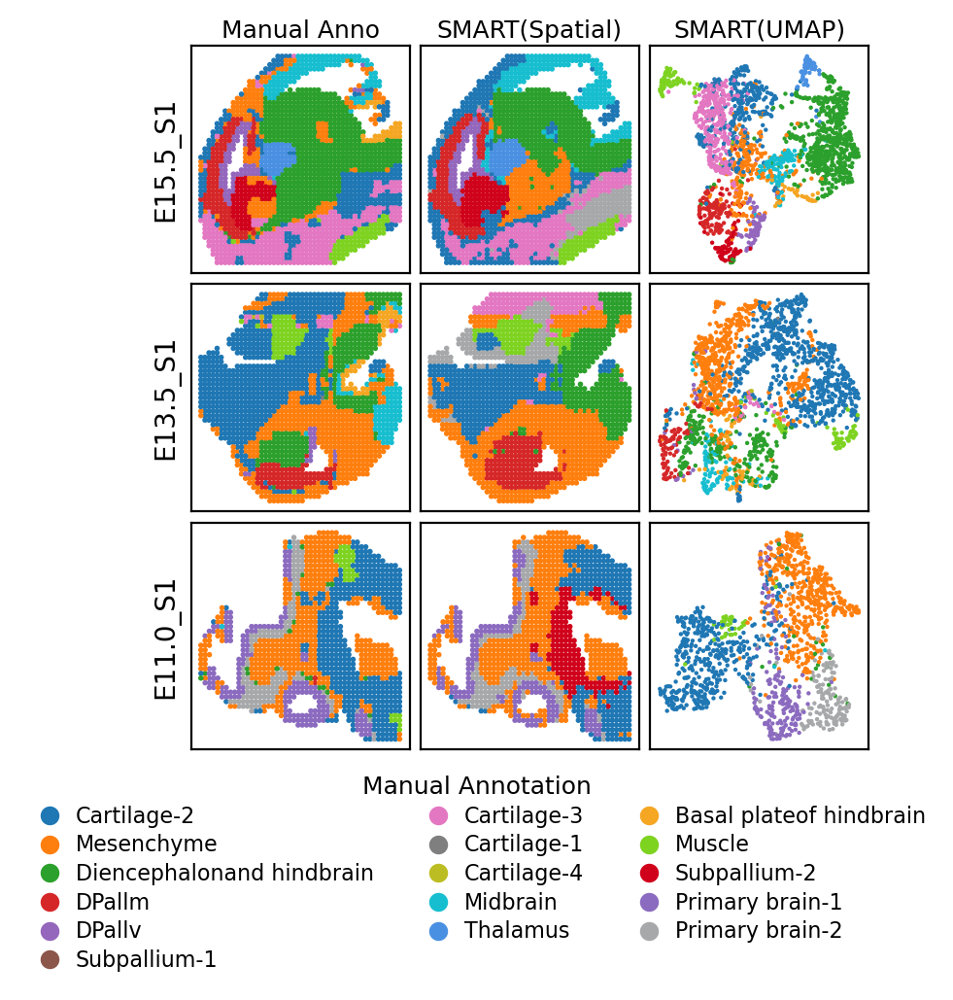

In [ ]:
from model.utils import getcolordict

adata=sc.concat(adatas,label="batch",join="outer")

colors = [
    '#1f77b4',  # blue
    '#ff7f0e',  # orange
    '#2ca02c',  # green
    '#d62728',  # red
    '#9467bd',  # purple
    '#8c564b',  # brown
    '#e377c2',  # pink
    '#7f7f7f',  # gray
    '#bcbd22',  # yellow
    '#17becf',  # cyan
    '#4a90e2',  # dark blue
    '#f5a623',  # dark orange
    '#7ed321',  # dark green
    '#d0021b',  # dark red
    '#8b6bbf',  # dark purple
    '#a7a8aa',  # dark gray
]
colordict=dict(zip(adata.obs['anno'].unique(),colors))


fig, ax_list = plt.subplots(3, 3, figsize=(4.5, 4.7),dpi=600)
plt.subplots_adjust(hspace=0.05, wspace=0.05)
for i,(j,k) in enumerate(zip(names[1:],[10,11,7,5][1:])):
    
    colordict1=getcolordict(adatas[j],f'SMART_{k}','anno',colordict)

    sc.pp.neighbors(adatas[j], use_rep='X_SMART', n_neighbors=10)
    sc.tl.umap(adatas[j])
    
    
    
    sc.pl.embedding(adata[adata.obs["batch"]==j], basis='spatial', color=f'SMART_{k}', ax=ax_list[i][1], title='SMART(Spatial)', s=16,palette=colordict1, show=False)
    sc.pl.embedding(adata[adata.obs["batch"]==j], basis='spatial', color='anno', ax=ax_list[i][0], title='Manual Anno', s=16,palette=colordict,
                    show=False)
    sc.pl.umap(adatas[j], color=f'anno', ax=ax_list[i][2], title='SMART(UMAP)', s=10,palette=colordict,legend_fontsize=7, show=False)
    
    if i!=0:
        ax_list[i][0].set_title("")
        ax_list[i][1].set_title("")
        ax_list[i][2].set_title("")
    
    ax_list[i][0].set_xlabel("")
    ax_list[i][0].set_ylabel(f"{j}")
    
    ax_list[i][1].set_xlabel("")
    ax_list[i][1].set_ylabel("")
    
    ax_list[i][2].set_xlabel("")
    ax_list[i][2].set_ylabel("")
    # ax_list[i][0].get_legend().remove()
    
    ax_list[i][0].get_legend().remove()
    ax_list[i][1].get_legend().remove()
    ax_list[i][2].get_legend().remove()
    #ax_list[i][0].legend(title="manual-anno legend",bbox_to_anchor=(1, -0.5),loc="lower center",frameon=False,ncol=3,labelspacing=0.3,handletextpad=0.2,fontsize=9)

circle_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=j, markersize=8, label=i)  for i,j in colordict.items()]
ax_list[i][1].legend(title="Manual Annotation",handles=circle_handles, bbox_to_anchor=(2.4,-0.03),frameon=False,ncol=3,labelspacing=0.3,handletextpad=0.2)
plt.show()
fig.savefig("cluster.jpg",format="jpg",bbox_inches='tight',transparent=True)

/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


1


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


7


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


2


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


2


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


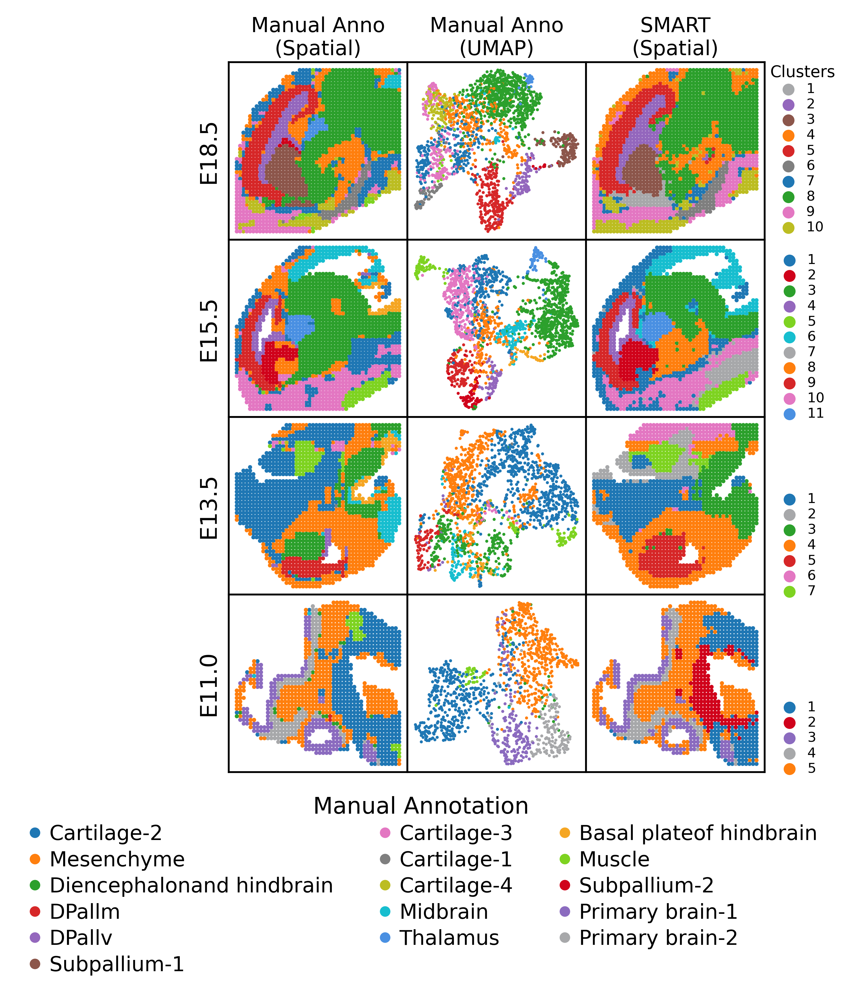

In [ ]:
from model.utils import getcolordict

plt.rcParams["legend.fontsize"] = 6               
plt.rcParams["legend.title_fontsize"] = 7 
plt.rcParams['legend.labelspacing'] = 0.1
plt.rcParams['legend.handlelength'] = 1
plt.rcParams['legend.markerscale'] = 0.7

adata=sc.concat(adatas,label="batch",join="outer")
colors = [
    '#1f77b4',  # blue
    '#ff7f0e',  # orange
    '#2ca02c',  # green
    '#d62728',  # red
    '#9467bd',  # purple
    '#8c564b',  # brown
    '#e377c2',  # pink
    '#7f7f7f',  # gray
    '#bcbd22',  # yellow
    '#17becf',  # cyan
    '#4a90e2',  # dark blue
    '#f5a623',  # dark orange
    '#7ed321',  # dark green
    '#d0021b',  # dark red
    '#8b6bbf',  # dark purple
    '#a7a8aa',  # dark gray
]
colordict=dict(zip(adata.obs['anno'].unique(),colors))

fig, ax_list = plt.subplots(4, 3, figsize=(4.2, 5.6),dpi=600)
plt.subplots_adjust(hspace=0, wspace=0)
for i,(j,k) in enumerate(zip(names,[10,11,7,5])):
    
    colordict1=getcolordict(adatas[j],f'SMART_{k}','anno',colordict)

    sc.pp.neighbors(adatas[j], use_rep='X_SMART', n_neighbors=10)
    sc.tl.umap(adatas[j])
    
    
    
    sc.pl.embedding(adata[adata.obs["batch"]==j], basis='spatial', color=f'SMART_{k}', ax=ax_list[i][2], title='SMART\n(Spatial)', s=13,palette=colordict1, show=False)
    sc.pl.embedding(adata[adata.obs["batch"]==j], basis='spatial', color='anno', ax=ax_list[i][0], title='Manual Anno\n(Spatial)', s=13,palette=colordict,
                    show=False)
    sc.pl.umap(adatas[j], color=f'anno', ax=ax_list[i][1], title='Manual Anno\n(UMAP)', s=7,palette=colordict,legend_fontsize=7, show=False)
    
    if i!=0:
        ax_list[i][0].set_title("")
        ax_list[i][1].set_title("")
        ax_list[i][2].set_title("")
    
    ax_list[i][0].set_xlabel("")
    ax_list[i][0].set_ylabel(f"{j}".replace("_S1",""))
    
    ax_list[i][1].set_xlabel("")
    ax_list[i][1].set_ylabel("")
    
    ax_list[i][2].set_xlabel("")
    ax_list[i][2].set_ylabel("")
    # ax_list[i][0].get_legend().remove()
    
    ax_list[i][0].get_legend().remove()
    ax_list[i][1].get_legend().remove()
    if i==0:
        ax_list[i][2].legend(loc=(1,0),labelspacing=0.16,frameon=False,ncol=1,title="Clusters")
    else:
        ax_list[i][2].legend(loc=(1.07,-0.05),labelspacing=0.16,frameon=False,ncol=1)
    #ax_list[i][0].legend(title="manual-anno legend",bbox_to_anchor=(1, -0.5),loc="lower center",frameon=False,ncol=3,labelspacing=0.3,handletextpad=0.2,fontsize=9)

circle_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=j, markersize=8, label=i)  for i,j in colordict.items()]
ax_list[i][1].legend(title="Manual Annotation",handles=circle_handles, bbox_to_anchor=(2.4,-0.03),frameon=False,ncol=3,labelspacing=0.3,handletextpad=0.2,fontsize=9,title_fontsize=10)
plt.show()
fig.savefig("cluster.jpg",format="jpg",bbox_inches='tight',transparent=True)
fig.savefig("cluster.png",format="png",bbox_inches='tight',transparent=True)

In [ ]:
color_dicts = {
    'MOFA+': '#1f77b4',     # blue
    'MEFISTO': '#ff7f0e',   # orange
    'MultiVI': '#2ca02c',   # green
    'PRESENT': '#d62728',   # red
    'scMM': '#9467bd',      # purple
    'SpatialGlue': '#8c564b',  # brown
    'TotalVI': '#e377c2',   # pink
    'SpaMultiVAE': '#7f7f7f',  # gray
    'CellCharter': '#bcbd22',  # yellow-green
    'MISO': '#17becf',      # cyan
    'COSMOS': '#FFC0CB',    # light pink
    'SMART': '#ff69b4',     # hot pink
    'SNF': '#ff6347',       # tomato red
    'WNN': '#4682b4',       # steel blue
}


In [ ]:
def draw(data_path,result_path,n1,ns,c=False):
    
    import scanpy as sc
    import seaborn as sns
    # adata = sc.read_h5ad(data_path + 'adata_RNA.h5ad')
    # adata_atac = sc.read_h5ad(data_path + 'adata_ATAC.h5ad')
    
    # adata.var_names_make_unique()
    # adata_atac.var_names_make_unique()

    # adata.obs["anno"] = pd.read_csv(data_path+"anno.csv", index_col=0)['cluster']

    # from muon import atac as ac
    # from model.utils import pca
    
    # # RNA
    # sc.pp.filter_genes(adata, min_cells=10)
    
    # sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=3000)
    # sc.pp.normalize_total(adata, target_sum=1e4)
    # sc.pp.log1p(adata)
    # sc.pp.scale(adata)
    
    
    # adata = adata[:, adata.var['highly_variable']]
    # adata.obsm['X_RNA'] = pca(adata, n_comps=50)
    
    # # ATAC
    # adata_atac = adata_atac[adata.obs_names].copy()  # .obsm['X_lsi'] represents the dimension reduced feature
    # ac.pp.tfidf(adata_atac, scale_factor=1e4)
    # sc.pp.normalize_per_cell(adata_atac, counts_per_cell_after=1e4)
    # sc.pp.log1p(adata_atac)
    # adata_atac.obsm['X_ATAC'] = pca(adata_atac, n_comps=50)
    
    # adata.obsm['X_ATAC']=adata_atac.obsm['X_ATAC']
    # adata.obsm['X_Seurat']=np.hstack([pca(adata, n_comps=50),pca(adata_atac, n_comps=50)])
    
    adata_Seurat=sc.read_h5ad(result_path+"adata_WNN.h5ad")
    adata_SNF=sc.read_h5ad(result_path+"adata_SNF.h5ad")
    if c:
        for i,j in zip(benchmarking,paths):
            a=sc.read_h5ad(result_path+j)
            a.obs.index=[k.split('_')[0] for k in a.obs.index]
            a=a[adata.obs.index]
            print(i,a.obsm)
            adata.obsm[f"X_{i}"]=next(iter(a.obsm.values()))
        
        
    
        for i in adata.obsm:
            print(i,adata.obsm[i].shape)
    
        for r in np.arange(0.1,1.6,0.01):
            sc.tl.louvain(adata_Seurat,resolution=r,key_added=f"Seurat_{r}")
            ncluster=len(adata_Seurat.obs[f"Seurat_{r}"].unique())
            print(f"resolution={r},ncluster={ncluster}")
            
        for n in range(ns[0],ns[1]):
            for i in adata_Seurat.obs:
                if "Seurat_" in i and len(adata_Seurat.obs[i].unique())==n:
                    adata.obs[f"Seurat_{n}"]=adata_Seurat.obs[i]
                    break
    
        for r in np.arange(0.1,1.6,0.01):
            sc.tl.louvain(adata_SNF,resolution=r,key_added=f"SNF_{r}")
            ncluster=len(adata_SNF.obs[f"SNF_{r}"].unique())
            print(f"resolution={r},ncluster={ncluster}")
            
        for n in range(ns[0],ns[1]):
            for i in adata_SNF.obs:
                if "SNF_" in i and len(adata_SNF.obs[i].unique())==n:
                    adata.obs[f"SNF_{n}"]=adata_SNF.obs[i]
                    break
    
        import os
    
        os.environ['R_HOME'] = '/home/ws6tg/anaconda3/envs/EnvR43/lib/R/'
        from model.utils import clustering
        for i in ['RNA','ATAC','MOFA+', 'MEFISTO', 'MultiVI', 'scMM', 'SpatialGlue', 'SMART','PRESENT']:
            for n in range(ns[0],ns[1]):
                clustering(adata, key="X_"+i, add_key=f"{i}_{n}", n_clusters=n, method="mclust", use_pca=True)
    
        adata.write_h5ad(result_path+"adata_all.h5ad")

    
    adata=sc.read_h5ad(result_path+"adata_all.h5ad")
    from sklearn.metrics.pairwise import pairwise_distances
    from sklearn.neighbors import kneighbors_graph
    from scipy.stats import pearsonr
    
    dis1=pairwise_distances(adata.obsm["X_ATAC"])
    dis2=pairwise_distances(adata.obsm["X_RNA"])
    df=pd.DataFrame(columns=["methods","modality","pearsonr"])
    for j in ['MOFA+', 'MEFISTO','MultiVI', 'PRESENT', 'scMM', 'SpatialGlue','SMART']:
        dis=pairwise_distances(adata.obsm[f"X_{j}"])
        for i in range(dis.shape[0]):
            corr, _ = pearsonr(dis[i], dis1[i])
            df.loc[len(df)]=[j,"ATAC",corr]
            corr, _ = pearsonr(dis[i], dis2[i])
            df.loc[len(df)]=[j,"RNA",corr]

    fig,ax = plt.subplots(figsize=(3,2),dpi=200)
    sns.violinplot(df,x="methods",y="pearsonr",hue="modality", split=True, gap=.05, inner="quart",linewidth=0.1,width=0.9)
    ax.set_ylim(-1,1.2)
    ax.set_ylabel("PCCs")
    ax.set_xlabel("")
    ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
    ax.legend(bbox_to_anchor=(0.6,0.15),frameon=False,ncol=3,labelspacing=0.1,handletextpad=0.1,columnspacing=0.6,fontsize=9)
    sns.despine()

    df2=pd.DataFrame(columns=["cluster","modality","pearsonr"])
    dis=pairwise_distances(adata.obsm[f"X_SMART"])
    for i,j in enumerate(adata.obs[f"SMART_{n1}"].values):
        corr, _ = pearsonr(dis[i], dis1[i])
        df2.loc[len(df2)]=[j,"ATAC",corr]
        corr, _ = pearsonr(dis[i], dis2[i])
        df2.loc[len(df2)]=[j,"RNA",corr]

    fig,ax = plt.subplots(figsize=(3,2),dpi=200)
    sns.violinplot(df2,x="cluster",y="pearsonr",hue="modality", split=True, gap=.05, inner="quart",linewidth=0.1,width=0.9)
    ax.set_ylabel("PCCs")
    ax.set_xlabel("")
    ax.legend(bbox_to_anchor=(0.5,0.2),frameon=False,ncol=3,labelspacing=0.2,handletextpad=0.1,fontsize=9)
    sns.despine()

    from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, adjusted_mutual_info_score, \
    homogeneity_score, mutual_info_score, v_measure_score

    result = pd.DataFrame(columns=["n_cluster","method","metries","score"])
    for i in ['MOFA+', 'MEFISTO', 'Seurat','SNF','MultiVI', 'PRESENT', 'scMM', 'SpatialGlue', 'SMART']:
        for j in range(ns[0],ns[1]):
            n=i+"_"+str(j)
            try:
                ari = adjusted_rand_score(adata.obs['anno'], adata.obs[n])
                nmi = normalized_mutual_info_score(adata.obs['anno'], adata.obs[n])
                ami = adjusted_mutual_info_score(adata.obs['anno'], adata.obs[n])
                homogeneity = homogeneity_score(adata.obs['anno'], adata.obs[n])
                mutual_info = mutual_info_score(adata.obs['anno'], adata.obs[n])
                v_measure = v_measure_score(adata.obs['anno'], adata.obs[n])
                
                d={"ARI": ari,
                    "NMI": nmi,
                    "AMI": ami,
                    "Homo": homogeneity,
                    "MI": mutual_info,
                    "V-Measure": v_measure}
                for k,v in d.items():
                    result.loc[len(result.index)]=[j,i,k,v]
            except:
                print(i)
    result.to_csv(result_path+"result.csv")


    df1=pd.DataFrame(columns=["method","morans_i"])
    for j in ['MOFA+', 'MEFISTO','MultiVI', 'PRESENT', 'scMM', 'SpatialGlue', 'SMART']:
        c=kneighbors_graph(adata.obsm["spatial"],n_neighbors=10)
        alt = sc.metrics.morans_i(c, adata.obsm[f"X_{j}"].T)
        for i in alt:
            df1.loc[len(df1)]=[j,i]
    df1["method"]=df1["method"].map(lambda x:"SMART" if x=='SMART' else x)

    fig,ax = plt.subplots(figsize=(3,2),dpi=200)
    sns.boxplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,fliersize=2,palette=color_dicts)
    ax.set_ylabel("Moran’s I Score")
    ax.set_xlabel("")
    ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
    sns.despine()

    result=pd.read_csv(result_path+"result.csv")
    import seaborn as sns
    fig,ax = plt.subplots(figsize=(6,1.5),dpi=200)
    sns.boxplot(x="metries",y="score",hue="method",data=result,ax=ax, fliersize=2,linewidth=0.5,width=0.7,palette=color_dicts)
    ax.set_yticks([0,0.4,0.8,1.2])
    ax.set_xlabel("")
    ax.legend(bbox_to_anchor=(0.64,1.0),frameon=False,ncol=3,labelspacing=0.1,handletextpad=0.1,columnspacing=0.6,fontsize=8)
    sns.despine()

    fig,ax = plt.subplots(figsize=(6,1.5),dpi=200)
    result_6=result[result["n_cluster"]==n1]
    sns.barplot(x="metries",y="score",hue="method",data=result_6,ax=ax,width=0.7,palette=color_dicts)
    ax.set_yticks([0,0.4,0.8,1.2])
    ax.set_xlabel("")
    ax.legend(bbox_to_anchor=(0.64,1.0),frameon=False,ncol=3,labelspacing=0.1,handletextpad=0.1,columnspacing=0.6,fontsize=8)
    sns.despine()

    color_dicts = [
    'MOFA+': '#1f77b4',     # blue
    'MEFISTO': '#ff7f0e',   # orange
    'MultiVI': '#2ca02c',   # green
    'PRESENT': '#d62728',   # red
    'scMM': '#9467bd',      # purple
    'SpatialGlue': '#8c564b',  # brown
    'TotalVI': '#e377c2',   # pink
    'SpaMultiVAE': '#7f7f7f',  # gray
    'CellCharter': '#bcbd22',  # yellow-green
    'MISO': '#17becf',      # cyan
    'COSMOS': '#FFC0CB',    # light pink
    'SMART': '#ff69b4',     # hot pink
    'SNF': '#ff6347',       # tomato red
    'WNN': '#4682b4',       # steel blue
    ]

    colordict=dict(zip(adata.obs['anno'].unique(),colors))
    
    from model.utils import getcolordict
    
    fig, ax_list = plt.subplots(2, 5, figsize=(10, 4.3),dpi=150)
    plt.subplots_adjust(hspace=0.2, wspace=0.05)
    for i,j in enumerate(['RNA',  'MOFA+', 'MEFISTO', 'MultiVI','PRESENT']+[ 'ATAC', 'SNF','scMM', 'Seurat','SpatialGlue']):
        
        colordict1=getcolordict(adata,f"{j}_{n1}","anno",colordict)
    
        sc.pl.embedding(adata, basis='spatial', color=f"{j}_{n1}", ax=ax_list[i//5][i%5], s=18,palette=colordict1, show=False)
        ax_list[i//5][i%5].set_title(j,size=10)
        ax_list[i//5][i%5].set_xlabel("")
        ax_list[i//5][i%5].set_ylabel("")
        ax_list[i//5][i%5].get_legend().remove()
    plt.show()

    fig, ax_list = plt.subplots(2, 5, figsize=(10, 4.3),dpi=150)
    plt.subplots_adjust(hspace=0.2, wspace=0.05)
    for i,j in enumerate(['RNA',  'MOFA+', 'MEFISTO', 'MultiVI','PRESENT']+[ 'ATAC', 'SNF','scMM', 'Seurat','SpatialGlue']):
        colordict1=getcolordict(adata,f"{j}_{n1}","anno",colordict)
        if j=="Seurat":
            adata_Seurat.obs[f"{j}_{n1}"]=adata.obs[f"{j}_{n1}"]
            sc.pl.umap(adata_Seurat, color=f"{j}_{n1}", ax=ax_list[i//5][i%5], title=j, s=10,palette=colordict1, show=False)
        if j=="SNF":
            adata_SNF.obs[f"{j}_{n1}"]=adata.obs[f"{j}_{n1}"]
            sc.pl.umap(adata_SNF, color=f"{j}_{n1}", ax=ax_list[i//5][i%5], title=j, s=10,palette=colordict1, show=False)
        else:
            sc.pp.neighbors(adata, use_rep="X_"+j, n_neighbors=10)
            sc.tl.umap(adata)
        
            sc.pl.umap(adata, color=f"{j}_{n1}", ax=ax_list[i//5][i%5], title=j, s=10,palette=colordict1, show=False)
        ax_list[i//5][i%5].set_title(j,size=10)
        ax_list[i//5][i%5].set_xlabel("")
        ax_list[i//5][i%5].set_ylabel("")
        ax_list[i//5][i%5].get_legend().remove()
    plt.show()

    fig, ax_list = plt.subplots(1, 2, figsize=(7, 3),dpi=150)

    colordict1=getcolordict(adata,f"SMART_{n1}","anno",colordict)
    sc.pp.neighbors(adata, use_rep='X_SMART', n_neighbors=10)
    sc.tl.umap(adata)
    
    sc.pl.umap(adata, color=f"SMART_{n1}", ax=ax_list[0], title='SMART', s=20, palette=colordict1,show=False)
    sc.pl.embedding(adata, basis='spatial', color=f"SMART_{n1}", ax=ax_list[1], title='SMART', s=55,palette=colordict1, show=False)
    
    plt.tight_layout(w_pad=0.3)
    plt.show()

    # fig, ax= plt.subplots(figsize=(3, 3),dpi=150)
    # sc.pl.embedding(adata, basis='spatial', color='anno', ax=ax, title='manual-anno',palette=colordict, s=55,show=False)
    # plt.tight_layout(w_pad=0.3)
    # plt.show()

/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_1473561/2551041254.py:26: ImplicitModificationWarning: Setting element `.obsm['X_RNA']` of view, initializing view as actual.
  adata.obsm['X_RNA'] = pca(adata, n_comps=50)


MOFA+ AxisArraysView with keys: X_mofa, feat, spatial
MEFISTO AxisArraysView with keys: X_mefisto, feat, spatial
MultiVI AxisArraysView with keys: X_MultiVI, spatial
PRESENT AxisArraysView with keys: embeddings, spatial
scMM AxisArraysView with keys: X_scMM, spatial


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


SpatialGlue AxisArraysView with keys: X_SpatialGlue, adj_feature, feat, spatial
SMART AxisArraysView with keys: SMART, SMART_pca, feat, spatial
spatial (2129, 2)
X_RNA (2129, 50)
X_ATAC (2129, 50)
X_Seurat (2129, 100)
X_MOFA+ (2129, 30)
X_MEFISTO (2129, 30)
X_MultiVI (2129, 64)
X_PRESENT (2129, 64)
X_scMM (2129, 64)
X_SpatialGlue (2129, 64)
X_SMART (2129, 64)
resolution=0.1,ncluster=5
resolution=0.11,ncluster=5
resolution=0.12,ncluster=5
resolution=0.13,ncluster=5
resolution=0.13999999999999999,ncluster=6
resolution=0.14999999999999997,ncluster=6
resolution=0.15999999999999998,ncluster=7
resolution=0.16999999999999998,ncluster=7
resolution=0.17999999999999997,ncluster=6
resolution=0.18999999999999995,ncluster=6
resolution=0.19999999999999996,ncluster=6
resolution=0.20999999999999996,ncluster=6
resolution=0.21999999999999995,ncluster=7
resolution=0.22999999999999995,ncluster=7
resolution=0.23999999999999994,ncluster=7
resolution=0.24999999999999992,ncluster=8
resolution=0.25999999999999

/tmp/ipykernel_1473561/2551041254.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
/tmp/ipykernel_1473561/2551041254.py:162: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,fliersize=2,palette=color_dicts)
/tmp/ipykernel_1473561/2551041254.py:165: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')


5
10
6
10
7
5
9
10
4


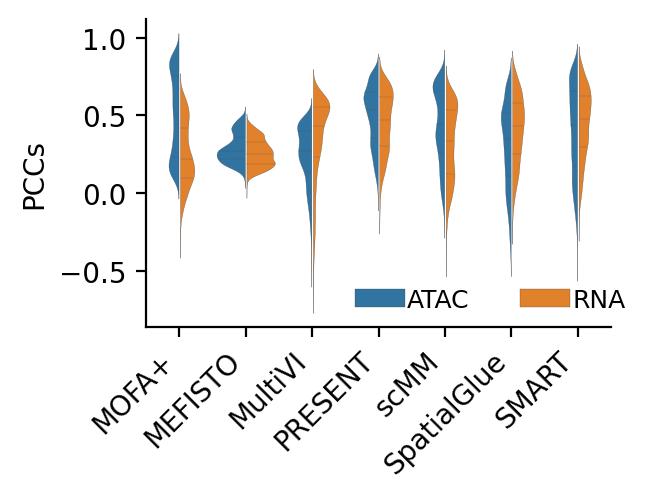

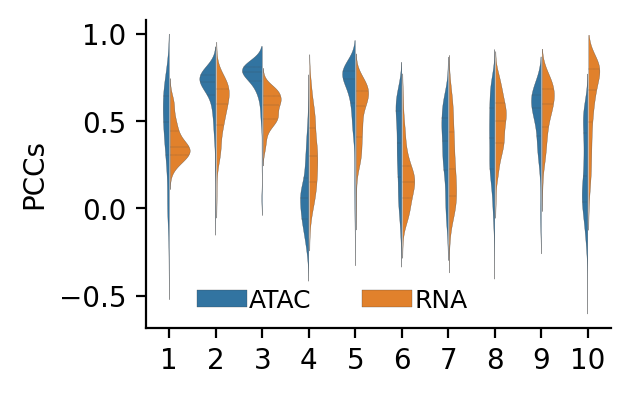

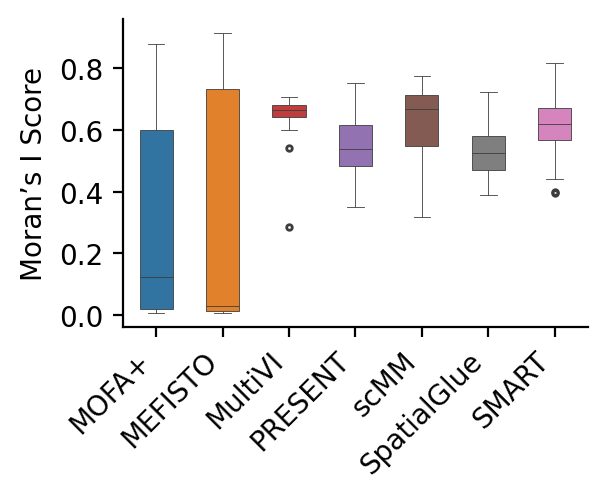

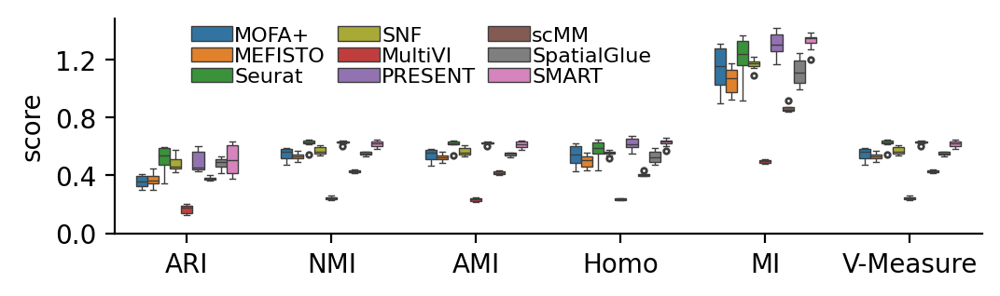

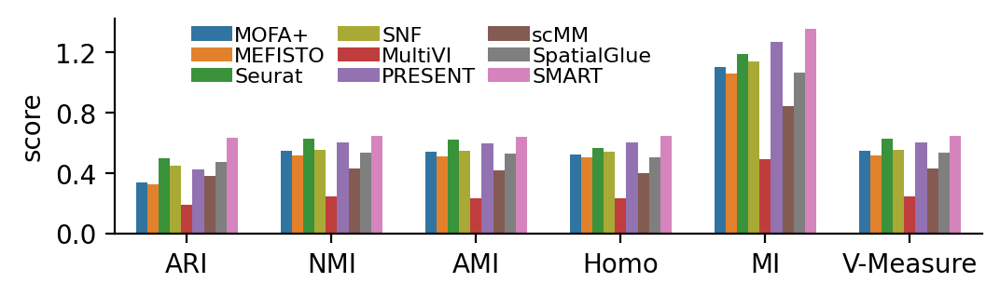

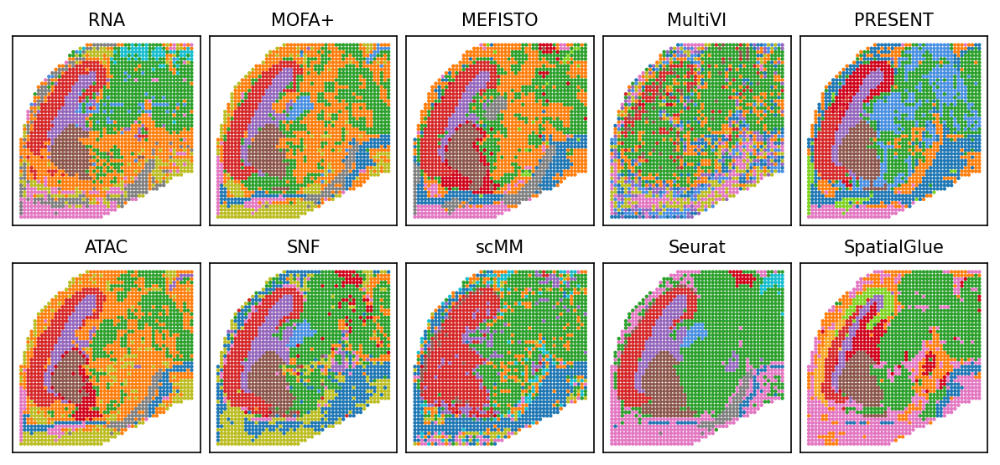

5
10
6
10
7
5
9
10
4


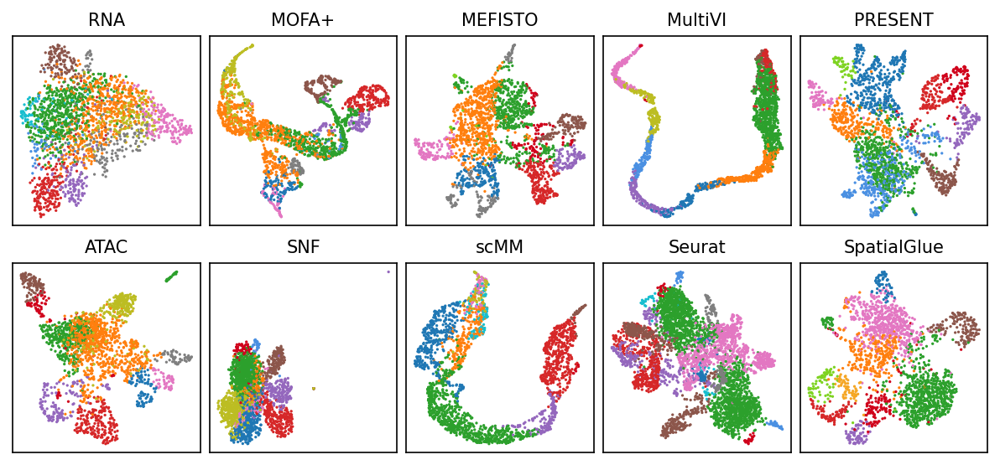

1


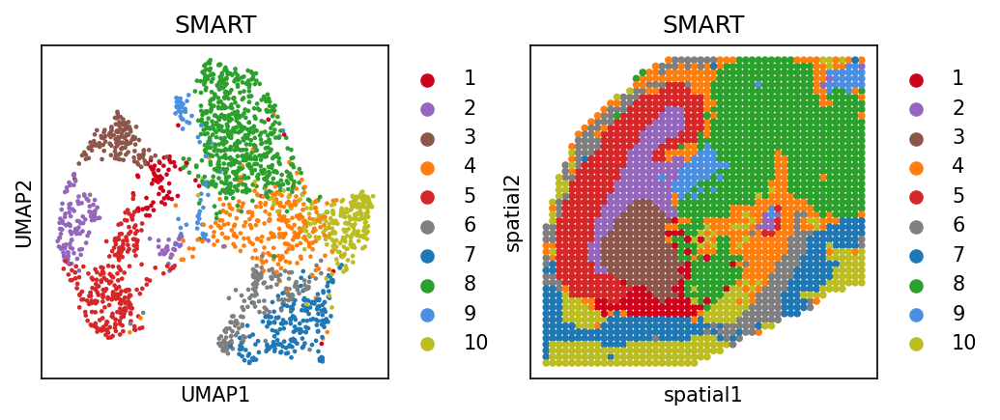

In [45]:
data_path="../datasets/Mouse_Brain_E18_S1/"
result_path="./Mouse_Brain_E18_S1/"
draw(data_path,result_path,n1=10,ns=(7,15),c=True)

/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_1473561/2551041254.py:26: ImplicitModificationWarning: Setting element `.obsm['X_RNA']` of view, initializing view as actual.
  adata.obsm['X_RNA'] = pca(adata, n_comps=50)
/tmp/ipykernel_1473561/2551041254.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')


MOFA+
MOFA+
MOFA+
MOFA+
MOFA+
MOFA+
MOFA+
MEFISTO
MEFISTO
MEFISTO
MEFISTO
MEFISTO
MEFISTO
MEFISTO
Seurat
Seurat
Seurat
Seurat
Seurat
Seurat
Seurat
SNF
SNF
SNF
SNF
SNF
SNF
SNF
MultiVI
MultiVI
MultiVI
MultiVI
MultiVI
MultiVI
MultiVI
PRESENT
PRESENT
PRESENT
PRESENT
PRESENT
PRESENT
PRESENT
scMM
scMM
scMM
scMM
scMM
scMM
scMM
SpatialGlue
SpatialGlue
SpatialGlue
SpatialGlue
SpatialGlue
SpatialGlue
SpatialGlue
SMART
SMART
SMART
SMART
SMART
SMART
SMART


/tmp/ipykernel_1473561/2551041254.py:162: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,fliersize=2,palette=color_dicts)
/tmp/ipykernel_1473561/2551041254.py:165: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')


5
5
10
6
10
7
7
5
9
10
4


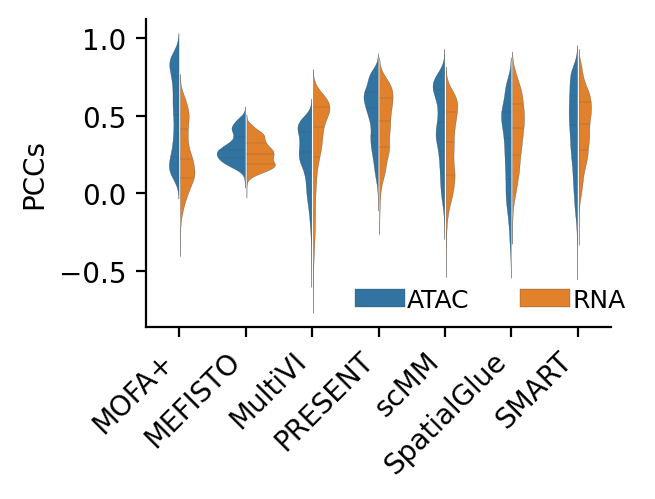

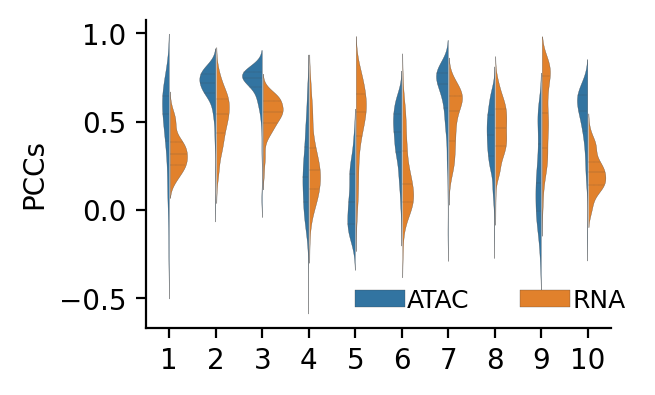

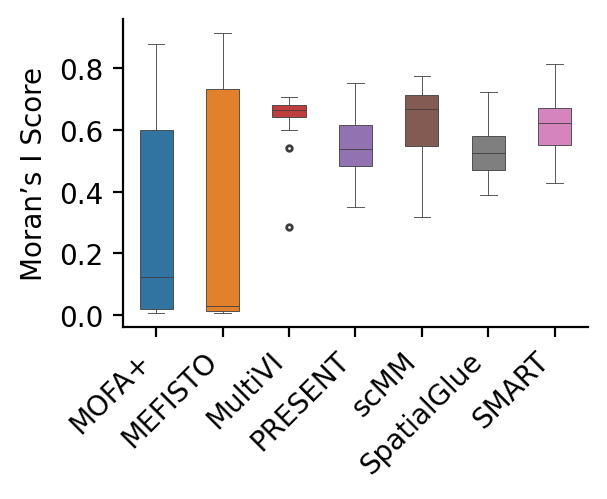

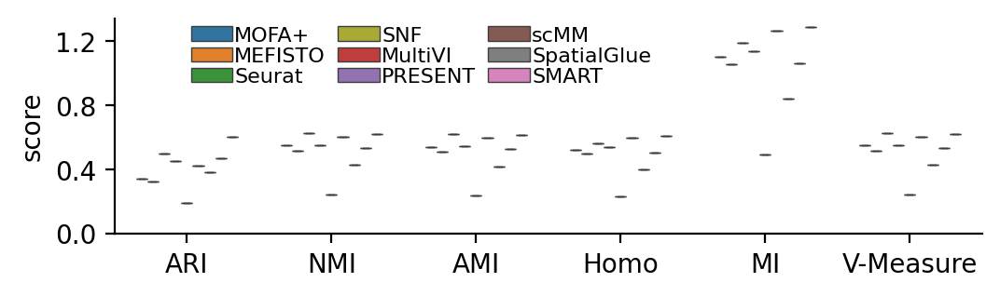

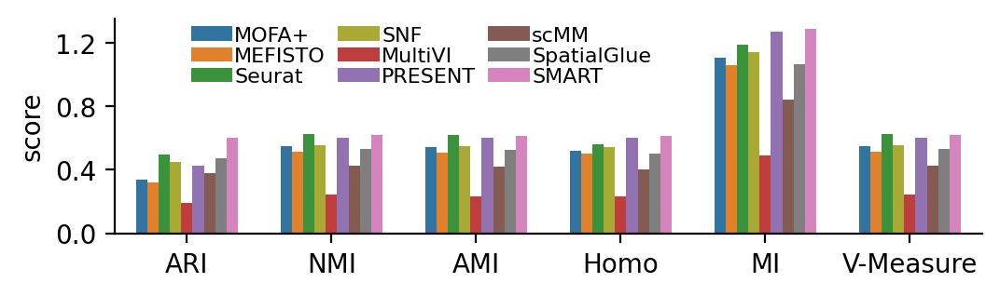

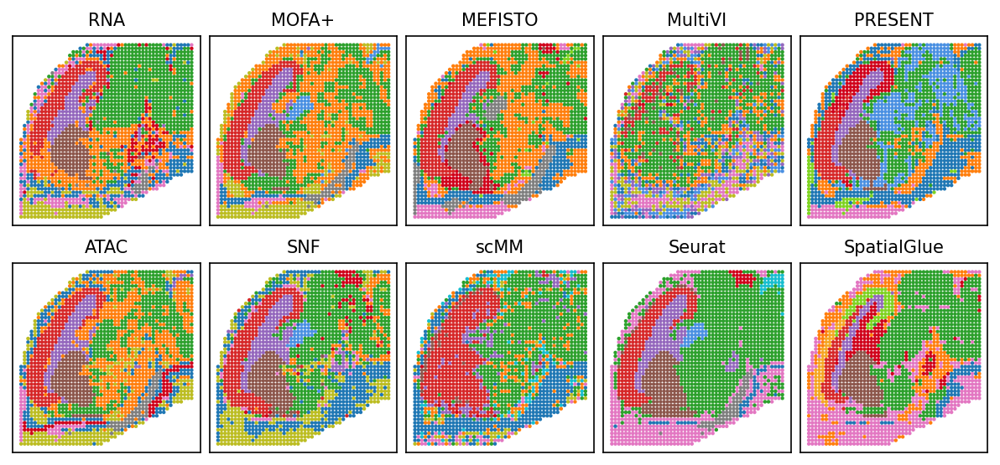

5
5
10
6
10
7
7
5
9
10
4


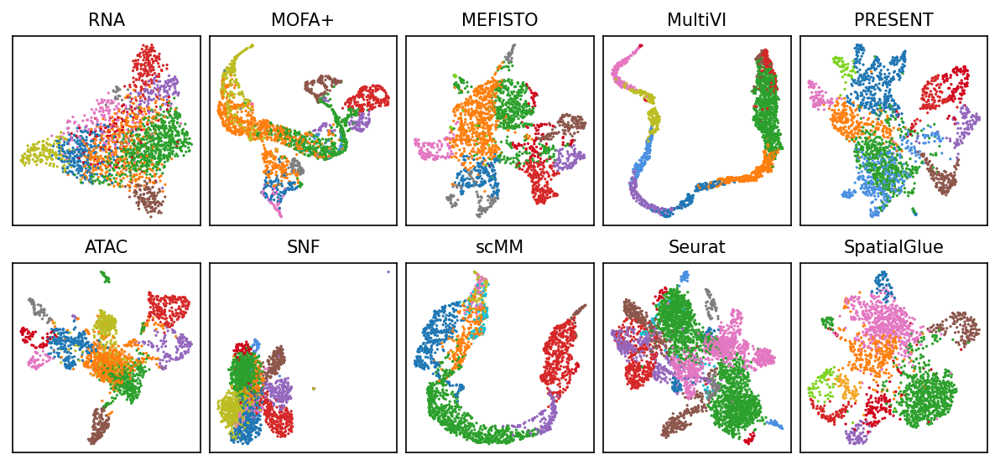

1


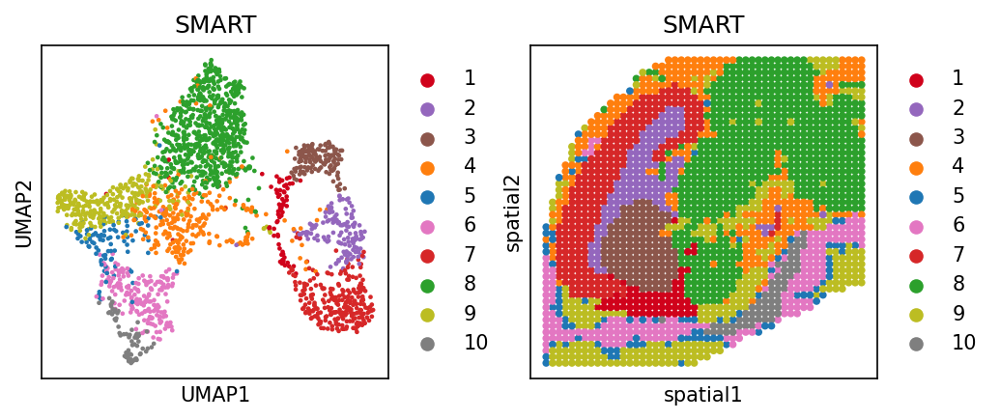

In [38]:
data_path="../datasets/Mouse_Brain_E18_S1/"
result_path="./Mouse_Brain_E18_S1/"
draw(data_path,result_path,n1=10,ns=(7,15))

/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_1473561/2551041254.py:26: ImplicitModificationWarning: Setting element `.obsm['X_RNA']` of view, initializing view as actual.
  adata.obsm['X_RNA'] = pca(adata, n_comps=50)
/tmp/ipykernel_1473561/2551041254.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
/tmp/ipykernel_1473561/2551041254.py:162: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,fliersize=2,palette=color_dicts)
/tmp/ipykernel_1473561/2551

10
11
7
8
11
4
3
10
10
10
4
9
10
11


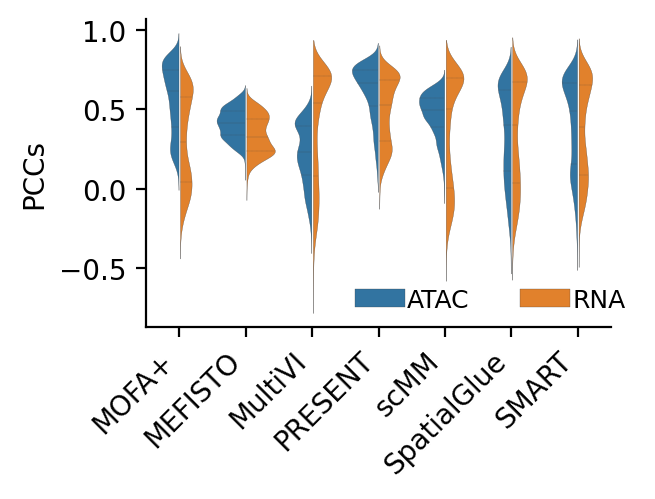

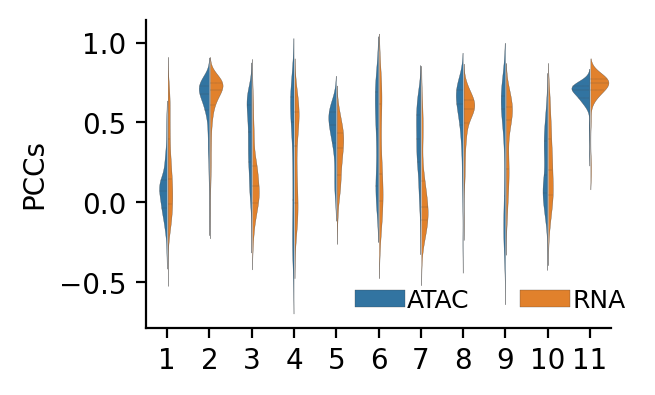

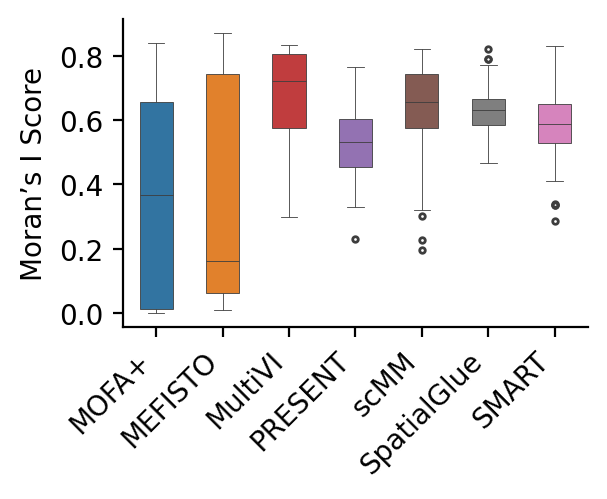

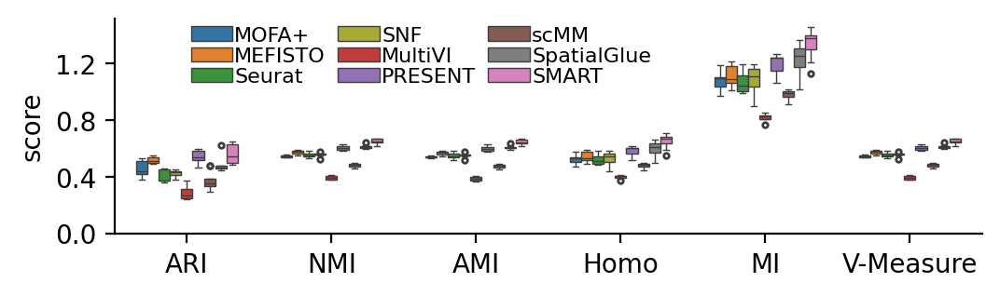

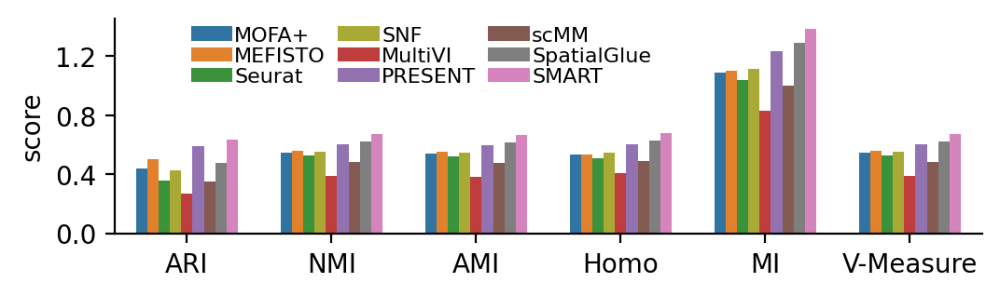

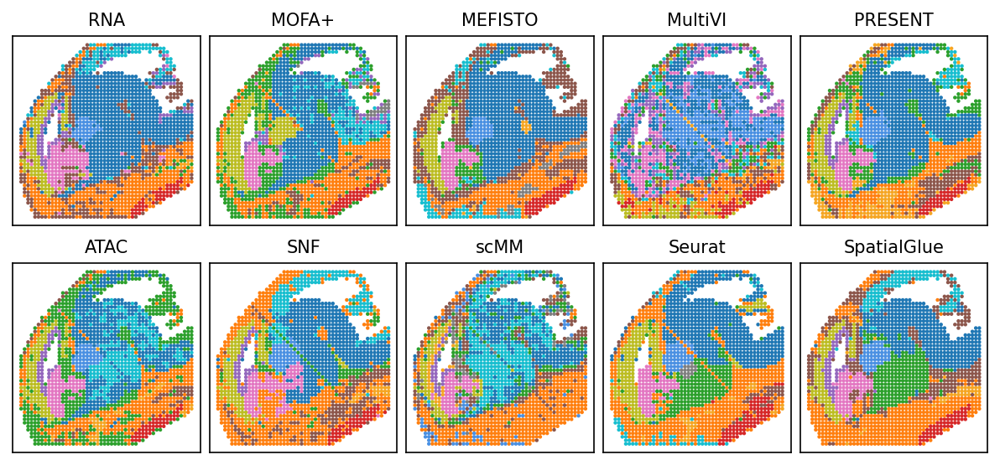

10
11
7
8
11
4
3
10
10
10
4
9
10
11


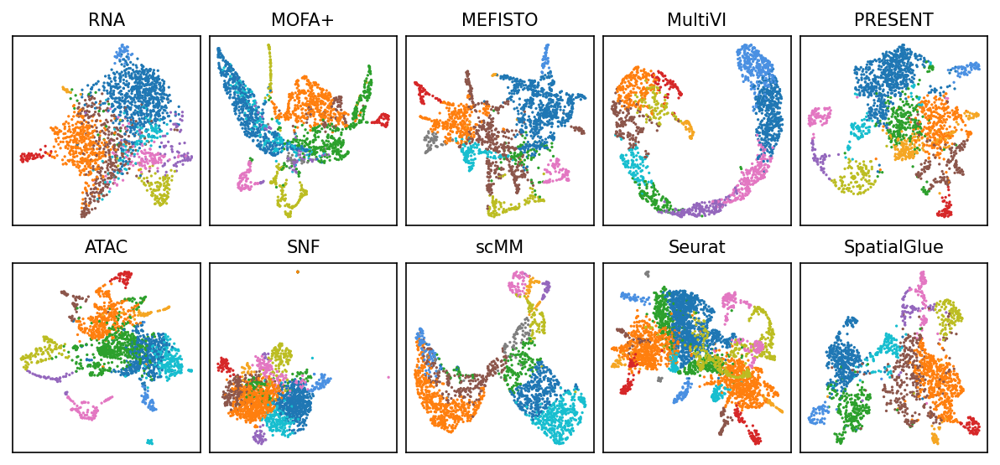

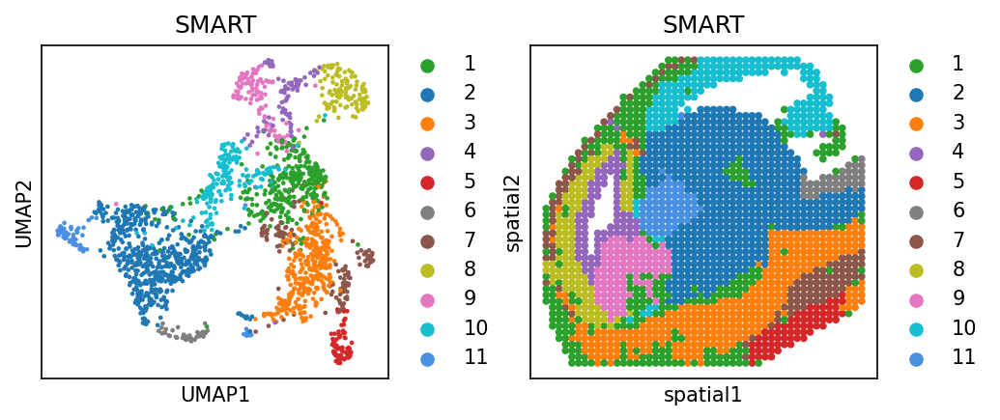

In [39]:
data_path="../datasets/Mouse_Brain_E15_S1/"
result_path="./Mouse_Brain_E15_S1/"
draw(data_path,result_path,n1=11,ns=(7,15))

/tmp/ipykernel_2393755/796139816.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')


Seurat


/tmp/ipykernel_2393755/796139816.py:162: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,fliersize=2,palette=color_dicts)
/tmp/ipykernel_2393755/796139816.py:165: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')


7
1
6
1
7
5
6
1
4
4
3
2
6
5


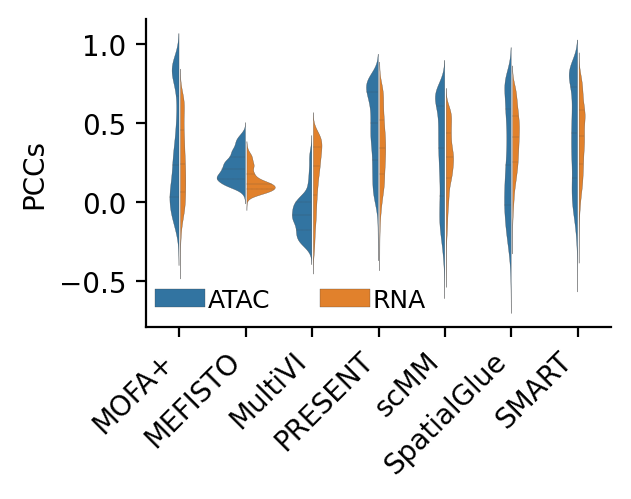

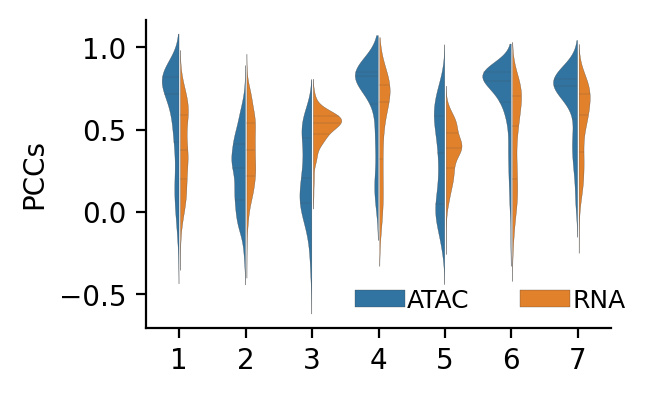

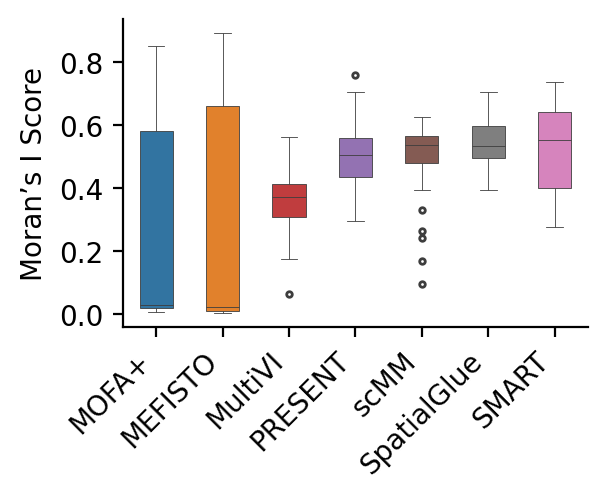

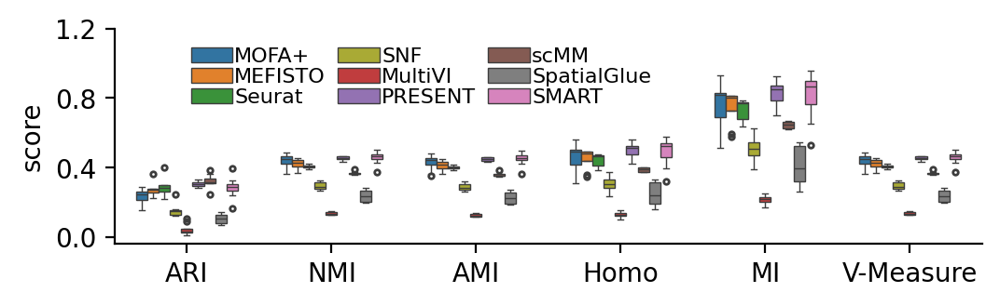

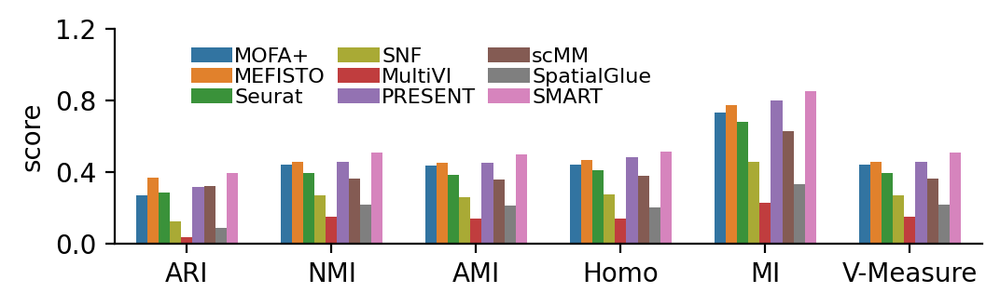

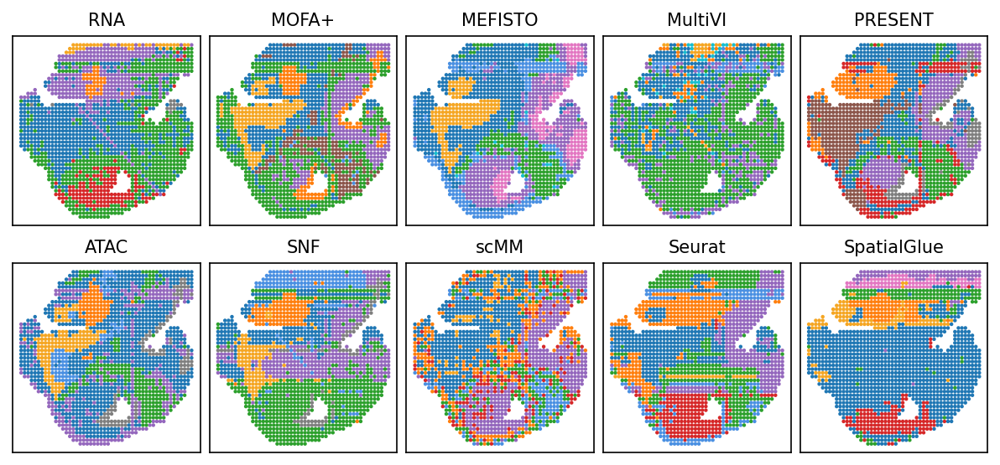

7
1
6
1
7
5
6
1
4
4
3
2
6
5


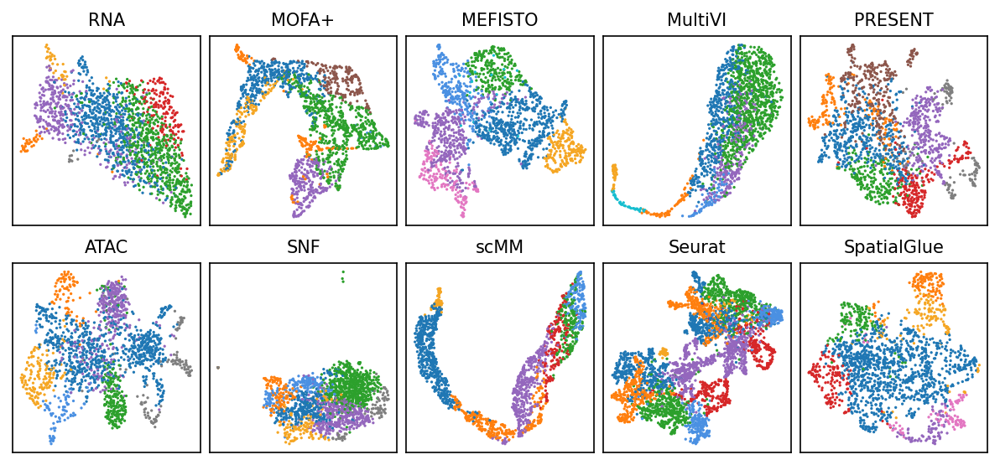

1
7


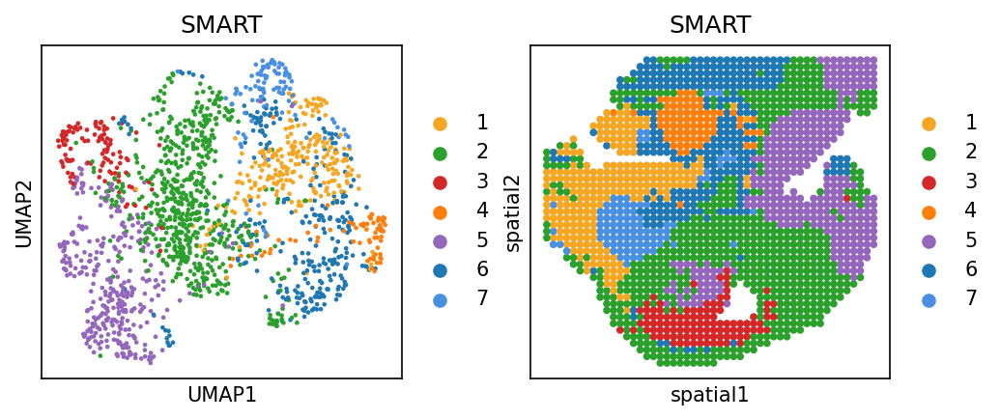

In [24]:
data_path="../datasets/Mouse_Brain_E13_S1/"
result_path="./Mouse_Brain_E13_S1/"
draw(data_path,result_path,n1=7,ns=(5,13))

/tmp/ipykernel_2393755/1612236956.py:107: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')
/tmp/ipykernel_2393755/1612236956.py:163: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(df1,x="method",y="morans_i",linewidth=0.3,width=0.5,fliersize=2,palette=color_dicts)
/tmp/ipykernel_2393755/1612236956.py:166: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45, ha='right')


4
4
4
3


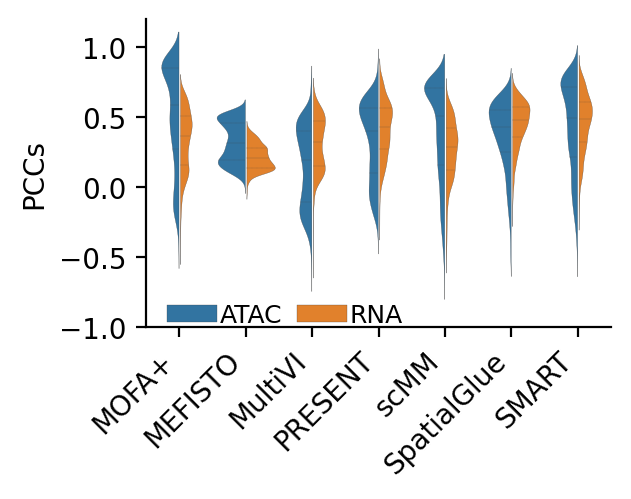

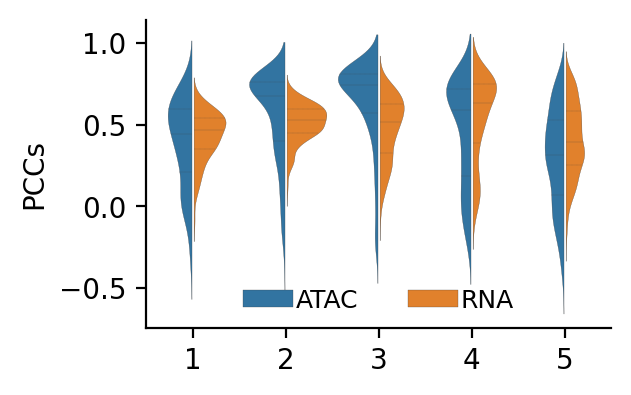

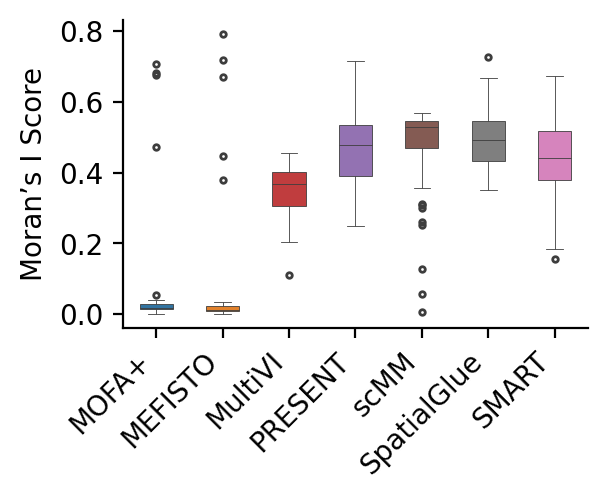

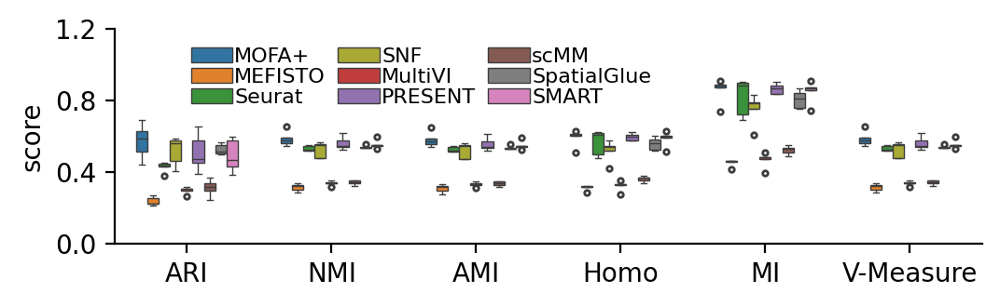

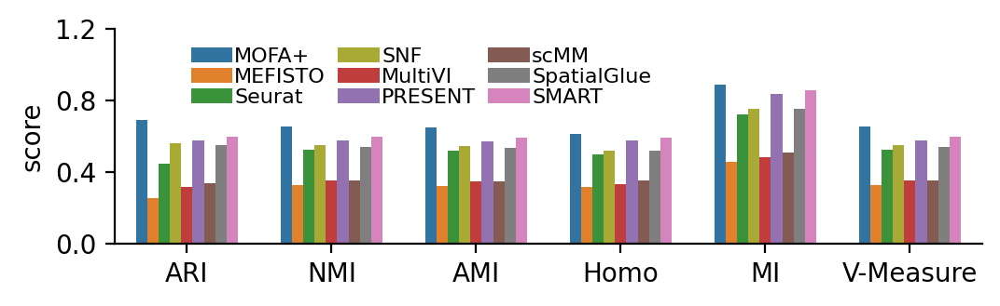

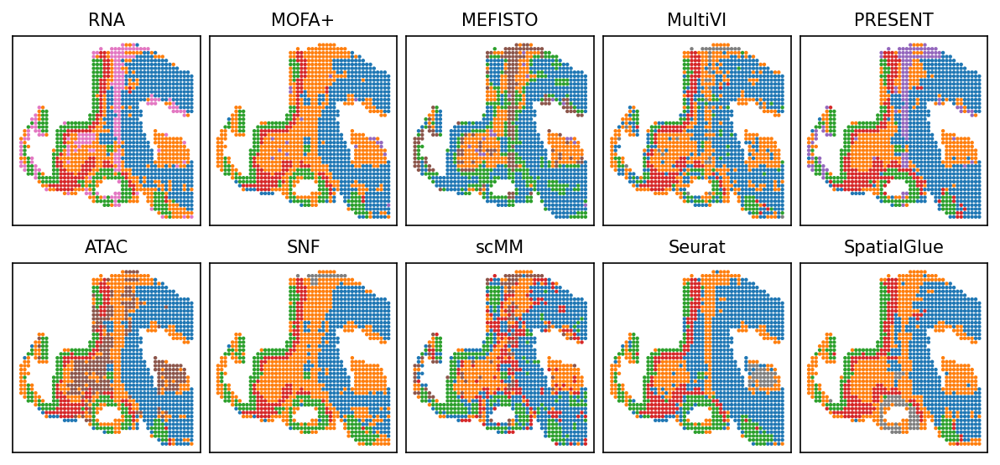

4
4
4
3


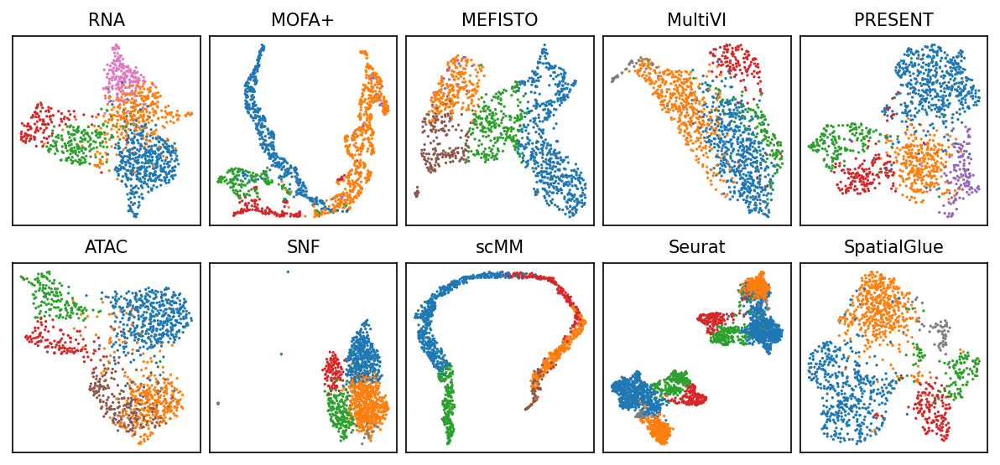

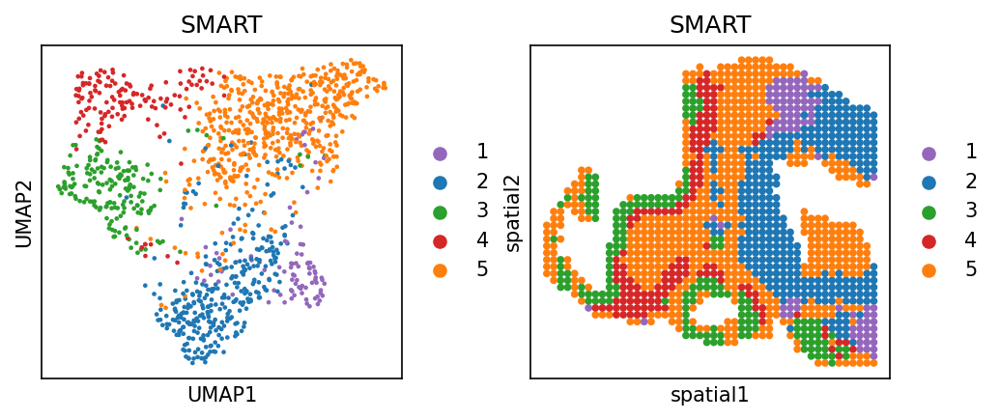

In [49]:
data_path="../datasets/Mouse_Brain_E11_S1/"
result_path="./Mouse_Brain_E11_S1/"
draw(data_path,result_path,n1=5,ns=(4,9))

In [31]:
adata=sc.concat(adatas,label="batch",join="outer")

/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [32]:
adata

AnnData object with n_obs × n_vars = 7118 × 8734
    obs: 'gex_barcode', 'atac_barcode', 'is_cell', 'excluded_reason', 'gex_raw_reads', 'gex_mapped_reads', 'gex_conf_intergenic_reads', 'gex_conf_exonic_reads', 'gex_conf_intronic_reads', 'gex_conf_exonic_unique_reads', 'gex_conf_exonic_antisense_reads', 'gex_conf_exonic_dup_reads', 'gex_exonic_umis', 'gex_conf_intronic_unique_reads', 'gex_conf_intronic_antisense_reads', 'gex_conf_intronic_dup_reads', 'gex_intronic_umis', 'gex_conf_txomic_unique_reads', 'gex_umis_count', 'gex_genes_count', 'atac_raw_reads', 'atac_unmapped_reads', 'atac_lowmapq', 'atac_dup_reads', 'atac_chimeric_reads', 'atac_mitochondrial_reads', 'atac_fragments', 'atac_TSS_fragments', 'atac_peak_region_fragments', 'atac_peak_region_cutsites', 'anno', 'WNN_7', 'WNN_8', 'WNN_9', 'WNN_10', 'WNN_11', 'WNN_12', 'WNN_13', 'WNN_14', 'SNF_7', 'SNF_8', 'SNF_9', 'SNF_10', 'SNF_11', 'SNF_12', 'mclust', 'RNA_7', 'RNA_8', 'RNA_9', 'RNA_10', 'RNA_11', 'RNA_12', 'RNA_13', 'RNA_14', 'A

In [33]:
#adata=adata[~adata.obs['anno'].isna()]

adata.obs['anno'].unique()

['Cartilage-2', 'Mesenchyme', 'Diencephalonand hindbrain', 'DPallm', 'DPallv', ..., 'Basal plateof hindbrain', 'Muscle', 'Subpallium-2', 'Primary brain-1', 'Primary brain-2']
Length: 16
Categories (16, object): ['Basal plateof hindbrain', 'Cartilage-1', 'Cartilage-2', 'Cartilage-3', ..., 'Primary brain-2', 'Subpallium-1', 'Subpallium-2', 'Thalamus']

1


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


7


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


2


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


2


/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/ws6tg/anaconda3/envs/scvi/lib/python3.9/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


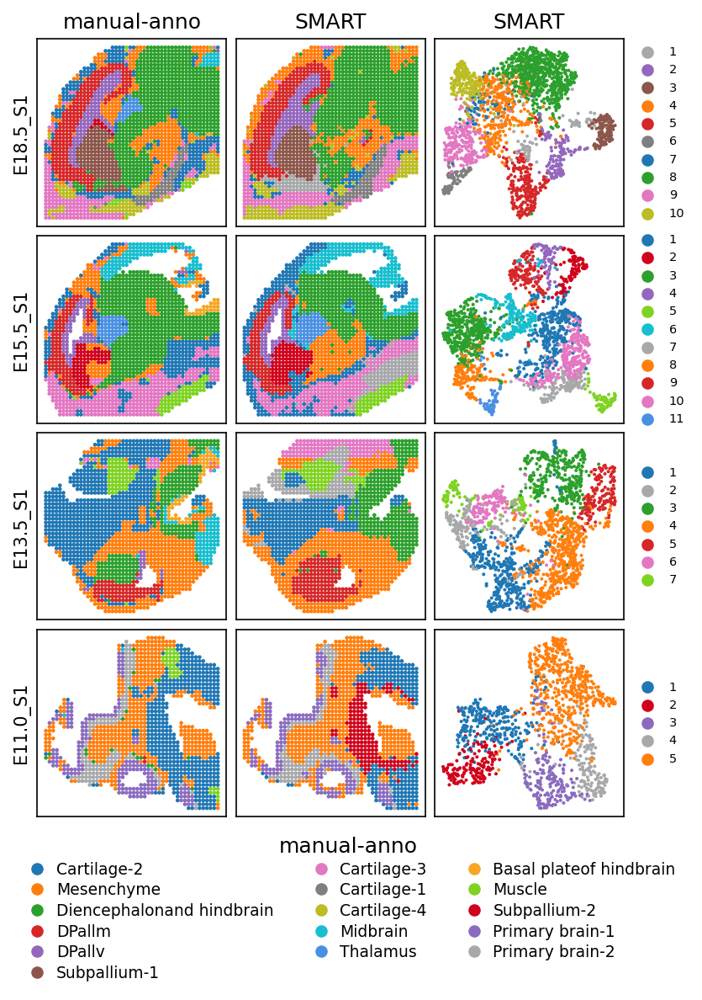

In [ ]:
from model.utils import getcolordict

colors = [
    '#1f77b4',  # blue
    '#ff7f0e',  # orange
    '#2ca02c',  # green
    '#d62728',  # red
    '#9467bd',  # purple
    '#8c564b',  # brown
    '#e377c2',  # pink
    '#7f7f7f',  # gray
    '#bcbd22',  # yellow
    '#17becf',  # cyan
    '#4a90e2',  # dark blue
    '#f5a623',  # dark orange
    '#7ed321',  # dark green
    '#d0021b',  # dark red
    '#8b6bbf',  # dark purple
    '#a7a8aa',  # dark gray
]
colordict=dict(zip(adata.obs['anno'].unique(),colors))

fig, ax_list = plt.subplots(4, 3, figsize=(6, 8),dpi=150)
plt.subplots_adjust(hspace=0.05, wspace=0.05)
for i,(j,k) in enumerate(zip(names,[10,11,7,5])):
    
    colordict1=getcolordict(adatas[j],f'SMART_{k}','anno',colordict)

    sc.pp.neighbors(adatas[j], use_rep='X_SMART', n_neighbors=10)
    sc.tl.umap(adatas[j])
    
    
    
    sc.pl.embedding(adata[adata.obs["batch"]==j], basis='spatial', color=f'SMART_{k}', ax=ax_list[i][1], title='SMART', s=20,palette=colordict1, show=False)
    sc.pl.embedding(adata[adata.obs["batch"]==j], basis='spatial', color='anno', ax=ax_list[i][0], title='manual-anno', s=20,palette=colordict,
                    show=False)
    sc.pl.umap(adatas[j], color=f'SMART_{k}', ax=ax_list[i][2], title='SMART', s=15,palette=colordict1,legend_fontsize=7, show=False)
    
    if i!=0:
        ax_list[i][0].set_title("")
        ax_list[i][1].set_title("")
        ax_list[i][2].set_title("")
    
    ax_list[i][0].set_xlabel("")
    ax_list[i][0].set_ylabel(f"{j}")
    
    ax_list[i][1].set_xlabel("")
    ax_list[i][1].set_ylabel("")
    
    ax_list[i][2].set_xlabel("")
    ax_list[i][2].set_ylabel("")
    # ax_list[i][0].get_legend().remove()
    
    ax_list[i][0].get_legend().remove()
    ax_list[i][1].get_legend().remove()
    #ax_list[i][0].legend(title="manual-anno legend",bbox_to_anchor=(1, -0.5),loc="lower center",frameon=False,ncol=3,labelspacing=0.3,handletextpad=0.2,fontsize=9)

circle_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=j, markersize=8, label=i)  for i,j in colordict.items()]
ax_list[i][1].legend(title="manual-anno",handles=circle_handles, bbox_to_anchor=(2.4,-0.03),frameon=False,ncol=3,labelspacing=0.3,handletextpad=0.2,title_fontsize=12,fontsize=9)
plt.show()

This notebook reproduces the experimental results presented in our manuscript. Instructions for accessing the data are available in /data/README.md.